In [3]:
import pandas as pd
csv = pd.read_csv("graph_data/mzs_20bin_30-12-2024.csv")
all_mzs = []
for mzs in [list(map(float, a.split(','))) for a in  list(csv.unique.values)]:
    all_mzs.extend(mzs)
all_mzs = list(set(all_mzs))
for mzs in [list(map(float, a.split(','))) for a in  list(csv.common.values)]:
    all_mzs.extend(mzs)

all_mzs = list(set(all_mzs))

In [4]:
import numpy as np
import tqdm
import math
from msi_visual.extract import timsdata
import sqlite3
from collections import defaultdict
        
class Resolve():
    def read_all_point_data(self, input_path: str, region: int = 0, mzs_to_resolve=[]):
        td = timsdata.TimsData(input_path)
        conn = td.conn
        xs = conn.execute(
            f"SELECT XIndexPos FROM MaldiFrameInfo WHERE RegionNumber={region}").fetchall()
        ys = conn.execute(
            f"SELECT YIndexPos FROM MaldiFrameInfo WHERE RegionNumber={region}").fetchall()
        regions = conn.execute(
            "SELECT RegionNumber FROM MaldiFrameInfo").fetchall()
        regions = [r[0] for r in regions]
        xs, ys = np.int32(xs), np.int32(ys)
        #xs = xs[::20]
        #ys = ys[::20]
        result = defaultdict(list)

        start_index = regions.index(region)
        
        for point_index, (x, y) in tqdm.tqdm(enumerate(zip(xs, ys)), total=len(xs)):
            frame_id = start_index+point_index+1
            q = conn.execute("SELECT NumScans FROM Frames WHERE Id={0}".format(frame_id))
            num_scans = q.fetchone()[0]
            mzs, intensities = [], []
            for scan in td.readScans(frame_id, 0, num_scans):
                index = np.array(scan[0], dtype=np.float64)
                mz = td.indexToMz(frame_id, index)
                intensity = scan[1]

                mzs.extend(list(mz))
                intensities.extend(list(intensity))
            mzs = np.float32(mzs)
            intensities = np.float32(intensities)

            #intensities = np.float32(intensities)
            for mz in mzs_to_resolve:
                # Find indices where mzs are within tolerance of target mz
                tol = 0.05 # Mass tolerance in Da
                matches = np.where(np.abs(mzs - mz) <= tol)[0]

                resolved_masses, resolved_intensities = [], []

                if len(matches) > 0:
                    # Get intensities for matching mz values
                    match_intensities = intensities[matches]
                    # Store coordinates and intensity
                    resolved_masses.extend(mzs[matches])
                    resolved_intensities.extend(match_intensities)
                result[mz].append((resolved_masses, resolved_intensities))


        return result

In [5]:
path = r"E:\\MSImaging-data\\MSI_slides\\2024-02-15_NRL4485_slide2_lipid_neg_timsON\\Slide2_lipid_neg_TIMS_on.d"
resolver0 = Resolve().read_all_point_data(path, region=0, mzs_to_resolve=all_mzs)
resolver1 = Resolve().read_all_point_data(path, region=1, mzs_to_resolve=all_mzs)
resolver2 = Resolve().read_all_point_data(path, region=2, mzs_to_resolve=all_mzs)
resolver3 = Resolve().read_all_point_data(path, region=3, mzs_to_resolve=all_mzs)

100%|██████████| 70372/70372 [2:00:30<00:00,  9.73it/s]    


In [8]:
import matplotlib.pyplot as plt 
%matplotlib inline

import numpy as np
from scipy.signal import find_peaks
from sklearn.mixture import GaussianMixture


def estimate_gaussian_centers(all_mzs, all_intensities, max_gaussians=10, num_samples=5000, 
                              bic_threshold=4, min_peak_distance=0.02):
    """
    Estimate the number, centers, and sample percentages of Gaussian components 
    while enforcing a minimum peak distance constraint.

    Parameters:
        mzs (list or np.array): The sampled m/z values.
        intensities (list or np.array): The measured intensity values.
        max_gaussians (int): Maximum number of Gaussian components to fit.
        num_samples (int): Number of samples to generate based on intensity weights.
        bic_threshold (float): Minimum BIC improvement required to increase component count.
        min_peak_distance (float): Minimum allowed distance between Gaussian centers.

    Returns:
        tuple: (num_gaussians, sorted_gaussian_centers, sorted_percentages)
    """

    mzs = np.array(all_mzs)
    intensities = np.array(all_intensities)

    # # Remove outliers using IQR method
    # Q1 = np.percentile(intensities, 20)
    # Q3 = np.percentile(intensities, 100)
    # IQR = Q3 - Q1
    # lower_bound = Q1 - 1.5 * IQR
    # upper_bound = Q3 + 1.5 * IQR
    
    # # Create mask for non-outlier values
    # mask = (intensities >= lower_bound) & (intensities <= upper_bound)
    mask = intensities >= np.median(intensities)


    # Filter both arrays using the mask
    mzs = mzs[mask]
    intensities = intensities[mask]


    
    # Step 1: Find initial peaks for rough component estimation
    peaks, _ = find_peaks(intensities, height=np.max(intensities) * 0.1)  # 10% threshold
    if len(peaks) == 0:
        return (0, [], [])  # No peaks detected

    # Step 2: Expand dataset by sampling according to intensity
    probabilities = intensities / np.sum(intensities)  # Normalize intensities
    #sampled_mzs = np.random.choice(mzs, size=num_samples, p=probabilities)  # Weighted resampling
    sampled_mzs = mzs


    # Step 3: Fit Gaussian Mixture Model (GMM) with automatic selection
    best_gmm = None
    best_bic = np.inf
    best_aic = np.inf
    optimal_n = 1  # Start with 1 Gaussian

    X = sampled_mzs.reshape(-1, 1)

    gmm = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
    gmm.fit(X)

    # Step 4: Extract Gaussian centers and sample percentages
    centers = gmm.means_.flatten()
    
    weights = gmm.weights_  # These represent the fraction of samples in each Gaussian
    covariances = gmm.covariances_

    # Step 5: Sort Gaussians by prominence (percentage of samples assigned)
    sorted_indices = np.argsort(weights)[::-1]  # Sort from highest to lowest weight
    sorted_centers = centers[sorted_indices]
    sorted_percentages = weights[sorted_indices] * 100  # Convert to percentages
    sorted_covariances = covariances[sorted_indices]

    # Step 6: Apply Minimum Peak Distance Constraint
    filtered_centers = []
    filtered_percentages = []
    filtered_covariances = []

    for i, center in enumerate(sorted_centers):
        if all(abs(center - c) >= min_peak_distance for c in filtered_centers):
            filtered_centers.append(center)
            filtered_percentages.append(sorted_percentages[i])
            filtered_covariances.append(sorted_covariances[i])

    # Filter centers and percentages to keep only those over 30%
    significant_indices = [i for i, p in enumerate(filtered_percentages) if p > 5]
    filtered_centers = [filtered_centers[i] for i in significant_indices]
    filtered_percentages = [filtered_percentages[i] for i in significant_indices]
    filtered_covariances = [filtered_covariances[i] for i in significant_indices]

    return (len(filtered_centers), filtered_centers, filtered_percentages, filtered_covariances)


result = defaultdict(list)

datas = defaultdict(list)
for resolver in [resolver1, resolver2, resolver3, resolver3]:
    for mz in resolver:
        datas[mz].extend(resolver[mz])

for mz, data in datas.items():
    all_mzs, all_intensities = [], []
    for mzs, intensities in data:
        all_mzs.extend(mzs)
        all_intensities.extend(intensities)

    n, mzs, ps, covs = estimate_gaussian_centers(all_mzs, all_intensities)
    result[mz] = (mzs, covs)
    
    # print(np.mean(all_mzs), np.average(all_mzs, weights=all_intensities))
    # plt.hist(all_mzs, bins=100)
    # plt.xlabel('m/z')
    # plt.ylabel('Count')
    # #plt.title(f'Histogram of m/z values around {mz:f}:\n{mzs}\n{ps}\n{n}')
    # plt.title(f'Histogram of m/z values around {mz:f}:\n{" ".join(map(str, mzs))}')
    # plt.show()

print(result)

defaultdict(<class 'list'>, {818.65: ([818.6280258177912, 818.6637550299356], [array([[4.44020893e-05]]), array([[0.000351]])]), 822.55: ([822.5774362622053, 822.5418793754417, 822.5218615553603], [array([[7.23815301e-05]]), array([[7.13192921e-05]]), array([[0.00012469]])]), 825.65: ([825.6639574120228, 825.6162693487033], [array([[3.35171143e-05]]), array([[0.00011344]])]), 832.5: ([832.5119824207786, 832.5335801028742], [array([[3.10549732e-05]]), array([[9.51627017e-05]])]), 832.6: ([832.606694370215, 832.6398282848872, 832.5659485933237], [array([[6.29143725e-05]]), array([[4.16697178e-05]]), array([[0.0001073]])]), 834.6: ([834.6223539331702, 834.5646174884707], [array([[2.14087954e-05]]), array([[7.53980259e-05]])]), 834.65: ([834.6228712222272], [array([[1.94984208e-05]])]), 835.65: ([835.6257433340809, 835.6507653603301], [array([[2.49446229e-05]]), array([[0.00044576]])]), 835.6: ([835.624325483577, 835.574600652145], [array([[4.24465097e-05]]), array([[0.00037132]])]), 836.6

In [25]:
new_csv = defaultdict(list)
all_msz = []

for category, unique, common in zip(csv.category, csv.unique, csv.common):
    unique_mzs = list(map(float, unique.split(',')))
    common_mzs = list(map(float, common.split(',')))
    
    unique_resolved = []
    common_resolved = []
    unique_cov = []
    common_cov = []
    for mz in unique_mzs:

        mzs, covs = result[mz]
        covs = [c[0][0] for c in covs]

        unique_resolved.extend(mzs)
        unique_cov.extend(covs)
        all_mzs.extend(mzs)
    for mz in common_mzs:
        mzs, covs = result[mz]
        covs = [c[0][0] for c in covs]

        common_resolved.extend(mzs)
        common_cov.extend(covs)
        all_mzs.extend(mzs)

    new_csv["category"].append(category)
    new_csv["common"].append(",".join(map(str, common_resolved)))
    new_csv["common_cov"].append(",".join([f"{mz:.6f}" for mz in common_cov]))
    new_csv["unique"].append(",".join(map(str, unique_resolved)))
    new_csv["unique_cov"].append(",".join([f"{mz:.6f}" for mz in unique_cov]))
    
new_csv = pd.DataFrame.from_dict(new_csv)
new_csv.to_csv("graph_data/resolved_full_with_cov_mzs_20bin_30-12-2024.csv", index=False)

In [31]:
import json
list_of_mzs_to_extract = sorted(list(set(all_mzs)))
with open("mzs.json", "w") as f:
    list_of_mzs_to_extract = list(map(str, list_of_mzs_to_extract))
    json.dump(list_of_mzs_to_extract, f)


In [3]:
from msi_visual.extraction import get_extraction_mz_list
from msi_visual.normalization import spatial_total_ion_count, total_ion_count, median_ion
from msi_visual.supervised.annotations import get_img, get_visualization, get_dataset
from scipy.stats import mannwhitneyu
import numpy as np
import tqdm
from argparse import Namespace
from pathlib import Path
array = np.array

path = r"E:\MSImaging-data\_msi_visual\Extractions\atlas_verification"
extraction_args = eval(
    open(
        Path(path) /
        "args.txt").read())
extraction_mzs = extraction_args.mzs

paths = [(path + "\\0.npy", 1), (path + "\\2.npy", 0), (path + "\\1.npy", 2), (path + "\\3.npy", 3)]



print(paths)

separation_data = {}
X_all, y_all, label_encoder_all = get_dataset(r"../scripts/graph_data/NRL4485-s2_reannotation_23-12-24_PAHJ.json", paths, subsample=5, normalization=median_ion)
categories = label_encoder_all.classes_
for i in tqdm.tqdm(range(len(categories))):
    category1 = categories[i]
    for j in range(i+1, len(categories)):
        category2 = categories[j]
        a, b = label_encoder_all.transform([category1, category2])
        indices_a = [i for i in range(len(y_all)) if y_all[i] == a]
        indices_b = [i for i in range(len(y_all)) if y_all[i] == b]
        X_all_a = X_all[indices_a, :]
        X_all_b = X_all[indices_b, :]
        indices = list(range(len(extraction_mzs)))
        separation_data[(category1, category2)] = []
        separation_data[(category2, category1)] = []
        for index in indices:
            x_a, x_b = X_all_a[:, index], X_all_b[:, index]
            statistic, pvalue = mannwhitneyu(x_a, x_b)
            statistic = statistic / (len(x_a) * len(x_b))
            intensity1 = np.mean(x_a)
            intensity2 = np.mean(x_b)
            if pvalue < 1 and statistic > 0.5:
                separation_data[(category1, category2)].append((extraction_mzs[index], statistic, pvalue, intensity1, intensity2))
            if pvalue < 1 and statistic < 0.5:
                separation_data[(category2, category1)].append((extraction_mzs[index], 1-statistic, pvalue, intensity2, intensity1))

        separation_data[(category1, category2)] = sorted(separation_data[(category1, category2)], key=lambda x: x[1], reverse=True)
        separation_data[(category2, category1)] = sorted(separation_data[(category2, category1)], key=lambda x: x[1], reverse=True)

            
    data = {"separation_data": separation_data, "categories": categories}

[('E:\\MSImaging-data\\_msi_visual\\Extractions\\atlas_verification\\0.npy', 1), ('E:\\MSImaging-data\\_msi_visual\\Extractions\\atlas_verification\\2.npy', 0), ('E:\\MSImaging-data\\_msi_visual\\Extractions\\atlas_verification\\1.npy', 2), ('E:\\MSImaging-data\\_msi_visual\\Extractions\\atlas_verification\\3.npy', 3)]
using normalization <function median_ion at 0x0000020EAAFFD440>
using normalization <function median_ion at 0x0000020EAAFFD440>
using normalization <function median_ion at 0x0000020EAAFFD440>
using normalization <function median_ion at 0x0000020EAAFFD440>


100%|██████████| 123/123 [1:13:56<00:00, 36.07s/it]


In [4]:
from collections import Counter, defaultdict
import pandas as pd
import numpy as np

def get_mzs(data):
    mz_counts = []
    pairs = list(data["separation_data"].keys())
    categories = list(set([p[0] for p in pairs]))
    result = {}
    intensities = {}
    for category in categories:
        mzs = []
        intensities1 = {}
        intensities2 = {}
        for pair in pairs:
            if pair[0] == category:
                for x in data["separation_data"][pair]:
                    #if x[1] > 0.7 and x[2] < 0.01 and (  (((x[3] / (x[4] + 1e-5) > 3)) and x[3] > 1000) or x[3] > 5000):
                    if x[1] > 0.7 and x[2] < 0.01:
                        mzs.append(x[0])
                        intensities1[x[0]] = x[3]
                        intensities2[x[0]] = x[4]

        c = Counter(mzs)
        most_common_mzs = c.most_common(100)
        top_10_mzs = [mz for mz, count in most_common_mzs]
        result[category] = top_10_mzs
        intensities[category] = intensities1, intensities2

        mz_counts.extend(top_10_mzs)

    mz_counts = Counter(mz_counts)
    return result, mz_counts, intensities

result, mz_counts, intensities = get_mzs(data)

unique_mzs = defaultdict(list)
common_mzs = defaultdict(list)
csv = defaultdict(list)
for category in result:
    th = 30
    for mz in result[category]:
        if mz in result["BG_ARTEFACT_ARTEFACT"]:
            continue
        if mz_counts[mz] < th:
            unique_mzs[category].append(f"{mz:.10f}")
        else:
            common_mzs[category].append(f"{mz:.10f}")

In [5]:
csv = pd.read_csv("graph_data/resolved_mzs_20bin_30-12-2024.csv")

new_csv = defaultdict(list)

for category in unique_mzs:
    new_csv["category"].append(category)
    new_csv["unique"].append(','.join(unique_mzs[category][:10]))
    new_csv["common"].append(','.join(common_mzs[category][:10]))
    
new_csv = pd.DataFrame.from_dict(new_csv)
print(new_csv)
#print(csv)

                 category                                             unique  \
0          WM_MP_ARTEFACT  858.6204233900,755.5787581400,779.5536862900,7...   
1            BST_TH_VPLPC  905.6217036600,904.6170875900,908.6396879000,8...   
2        CNU_GPE_GPE SUB3  1045.4775324700,1110.8804923300,1137.902726520...   
3        CTX_CLA_ARTEFACT  1046.4827643800,1045.4775324700,1067.466196370...   
4         CTX_L2_ARTEFACT  929.5662546700,840.5308999000,540.0534138000,7...   
..                    ...                                                ...   
117            BST_TH_MGD  1165.9222635500,1164.9136751200,1162.902982080...   
118             BST_MB_OP  873.6389349500,863.5644978700,863.5630137900,8...   
119       WM_ACT_ARTEFACT  1135.8832477500,806.5914425000,833.6102180700,...   
120  CTX_HPF_CA1-SLM SUB1  808.1234028400,806.5095737400,1164.9136751200,...   
121      CNU_GPE_GPE SUB6  1045.4775324700,1003.4706693500,1046.482764380...   

                                       

In [114]:
csv[csv.category == "PLQ_ARTEFACT_ARTEFACT"].unique.values[0].split(",")

['857.5168924033804',
 '858.520584799835',
 '858.5715897192295',
 '762.5044078691427',
 '886.554304755267',
 '885.5490415068243',
 '763.5102594391197',
 '887.5554043191587',
 '858.5205645757742',
 '885.5544764281925',
 '885.5879725705356',
 '883.5839965784332',
 '883.5633433267549']

In [321]:
from msi_visual.normalization import total_ion_count, spatial_total_ion_count
from PIL import Image
import numpy as np
from msi_visual.extraction import get_extraction_mz_list
import cv2
from skimage.color import rgb2hed, hed2rgb
import os

def get_ion_image(img, mzs, category, intensity=None):
    indices = [list(extraction_mzs).index(float(mz[0])) for mz in mzs]
    weights = np.float32([float(mz[1]) for mz in mzs])
    if np.sum(weights) == 0:
        return None, None
        
    mask = img.max(axis=-1)
    img = img / np.max(img, axis=(0, 1))
    ion = img[:, :, indices]
    # Take weighted average across mz dimension using provided weights
    ion = np.average(ion, axis=2, weights=weights)
    
    if intensity is None:
        ion = ion / ion.max()
    else:
        ion = ion / intensity
    #ion = np.uint8(ion * 255)


    ion = ion / np.percentile(ion, 100)
    ion[ion > 1] = 1


    # Apply non-linear stretching to emphasize larger values
    # Using power function with exponent < 1 to compress lower values and stretch higher ones
    ion = np.power(ion, 1)  # Adjust exponent as needed (smaller = more stretching)
    ion = np.uint8((ion / ion.max()) * 255)  # Rescale back to 0-255 range
    #ion = np.uint8(ion* 255)  # Rescale back to 0-255 range

    #display(Image.fromarray(ion))


    # Convert grayscale to RGB IHC-like coloring
    # Create RGB image with brown for high values and light pink for low values
    rgb = np.zeros((ion.shape[0], ion.shape[1], 3), dtype=np.uint8)
    
    # Brown color (RGB: 139, 69, 19) for high values
    # Light pink (RGB: 255, 228, 225) for low values
    rgb[:,:,0] = np.uint8(255 - ion * 0.45)  # R channel 
    rgb[:,:,1] = np.uint8(228 - ion * 0.62)  # G channel
    rgb[:,:,2] = np.uint8(225 - ion * 0.81)  # B channel


    # Create a colormap from white to brown
    white = np.array([255, 255, 255])
    brown = np.array([139, 69, 19]) 
    
    # Create normalized intensity values between 0 and 1
    norm_ion = ion.astype(float) / 255
    
    # For each pixel, interpolate between white and brown based on intensity
    for i in range(3):  # RGB channels
        rgb[:,:,i] = np.uint8(white[i] + (brown[i] - white[i]) * norm_ion)

    rgb[mask == 0] = 0

    
    # This creates a brownish-purple tone typical of IHC staining
    ion = rgb
    # Add text overlay with category name
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.8
    font_color = (255, 50, 60)  # White text
    font_thickness = 2
    text_size = cv2.getTextSize(category, font, font_scale, font_thickness)[0] * 2
    
    # Position text at top center
    ##text_x = (ion.shape[1]) // 2
    text_x = 10
    text_y = text_size[1] + 10  # Add some padding from top

    # Rotate image 90 degrees counterclockwise
    ion = cv2.rotate(ion, cv2.ROTATE_90_COUNTERCLOCKWISE)

    ion_no_text = ion.copy()
    # Add text to image
    category = category.replace("_ARTEFACT", "")
    cv2.putText(ion, category, (text_x, text_y), font, font_scale, font_color, font_thickness)
    return ion, ion_no_text


for path, path_index in paths:

    img = np.load(path)
    img = total_ion_count(img)

    images = []
    aggregated_folder = None
    aggregated_folder = "aggregated_per_category_full_precision_power1_weighted"
    os.makedirs(aggregated_folder, exist_ok=True)
    
    for category in list(common_mzs.keys()):
        
        mz_data = common_mzs[category]        
        
        ion, ion_no_text = get_ion_image(img, mz_data, category, intensity=None)
        ion_common = ion.copy()
        print(category, mzs)
        Image.fromarray(ion).save(f"{aggregated_folder}/{category.replace('_ARTEFACT', '')}_{path_index}_common.png")
        Image.fromarray(ion_no_text).save(f"{aggregated_folder}/{category.replace('_ARTEFACT', '')}_{path_index}_common_no_text.png")

        mz_data = unique_mzs[category]



        ion, ion_no_text = get_ion_image(img, mz_data, category, intensity=None)
        if ion is None:
            continue

        Image.fromarray(ion).save(f"{aggregated_folder}/{category.replace('_ARTEFACT', '')}_{path_index}_unique.png")
        Image.fromarray(ion_no_text).save(f"{aggregated_folder}/{category.replace('_ARTEFACT', '')}_{path_index}_unique_no_text.png")


CTX_HPF_DG-SG 658.85612769,842.54181589,723.51631897,718.79230323,722.51188009,659.85774756,680.8361398,1133.8683824,696.80977391,751.54580817,1133.87393109,746.51236629,1132.86271187,750.54336618,843.5577521,746.51237834,750.54245261,1132.86397317,1136.896777,882.5276895,1109.86502188,1109.86579218,1109.90556077,1108.86304754,1108.86336833,764.52248842,764.5229068,883.53274826,865.50307848,810.5280354,810.52814275,1134.87287273,772.52741731,772.52826365,905.57034483,884.53634704,844.56220803,817.53632601,765.56658813,844.56113782,738.50719055,906.57394191,1179.73081311,771.53294285,773.53236668,739.51047725,1180.73943434,856.54196326,856.54366138,528.27224515,528.27265287,796.54908467,866.50730465,797.5467934,842.55966875,885.57728355,724.52581702,864.51198783,878.52786186,1137.90272652,814.53232728,529.27476897,811.53184647,1181.74247752,789.52635852,832.5335801,1133.89897842,882.530108,933.63190211,832.51198242,480.27230486,833.47865361,842.5178884,909.58836385,754.53554406,884.5609

In [6]:
from collections import Counter, defaultdict
import pandas as pd
import numpy as np

def get_mzs(data, categories=None):
    mz_counts = []
    pairs = list(data["separation_data"].keys())
    if categories is None:
        categories = list(set([p[0] for p in pairs] + [p[0] for p in pairs]))
    result = {}
    intensities = {}
    scores = defaultdict(lambda: np.zeros(len(categories)))
    counts = defaultdict(lambda: np.zeros(len(categories)))
    for category_index, category in enumerate(categories):
        mzs = []
        for pair in pairs:
            if pair[0] == category and pair[1] in categories:
                for x in data["separation_data"][pair]:
                    if x[2] < 0.05 and x[1] > 0.5:
                        scores[x[0]][category_index] = scores[x[0]][category_index] + 2*x[1] - 1
                        counts[x[0]][category_index] = counts[x[0]][category_index] + 1
                    # elif x[2] < 0.01 and x[1] < 0.5:
                    #      scores[x[0]][category_index] = scores[x[0]][category_index] -(2 *x[1] - 1)
    
    # for x in scores:
    #     for category_index, category in enumerate(categories):
    #         scores[x][category_index] = scores[x][category_index] / (1e-7 + counts[x][category_index])
        
    #print(scores[885.54829752][categories.index("PLQ_ARTEFACT_ARTEFACT")])
    return scores

scores = get_mzs(data)


In [7]:
import matplotlib.pyplot as plt
import joblib



pairs = list(data["separation_data"].keys())
categories = list(set(list(set([p[0] for p in pairs])) + list([p[1] for p in pairs])))
unique_mzs = defaultdict(list)
common_mzs = defaultdict(list)
for mz in scores:
#for mz in [885.54829752]:
    # Get scores for this m/z and sort categories by score
    scores_for_mz = scores[mz]


    sorted_indices = np.argsort(scores_for_mz)[::-1]  # Sort in descending order
    top_categories = [categories[i] for i in sorted_indices[:10]]    
    scores_for_mz = get_mzs(data, categories=top_categories)[mz]
    top_10_scores = scores_for_mz
    print("len(top_10_scores)", len(top_10_scores))

    # # Create a bar plot
    # plt.figure(figsize=(12, 6))
    # plt.bar(range(len(top_categories)), top_10_scores)

    # # Customize the plot
    # plt.xticks(range(len(top_categories)), [cat.replace('_ARTEFACT', '') for cat in top_categories], rotation=45, ha='right')
    # plt.xlabel('Categories')
    # plt.ylabel('Scores')
    # plt.title(f'Category Scores for m/z {mz:.4f}')

    # # Add grid for better readability
    # plt.grid(True, axis='y', linestyle='--', alpha=0.7)

    # # Adjust layout to prevent label cutoff
    # plt.tight_layout()

    # plt.show()

    if np.max(top_10_scores) > 0.0:
        winning_category = top_categories[np.argmax(top_10_scores)]

        unique_mzs[winning_category].append((mz, np.max(top_10_scores)))
    else:
        winning_category = -1

    scores_for_mz = scores[mz]
    sorted_indices = np.argsort(scores_for_mz)[::-1]  # Sort in descending order
    top_categories = [categories[i] for i in sorted_indices[:20]]    
    
    scores_for_mz = get_mzs(data, categories=top_categories)[mz]
    top_10_scores = scores_for_mz
    print("lens", len(top_categories), len(scores_for_mz))

    for category_index, category in enumerate(top_categories):
        if category != winning_category:
            score = scores_for_mz[category_index]
            if score > 0.0:
                common_mzs[category].append((mz, score))

len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10_scores) 10
lens 20 20
len(top_10

In [377]:
result_csv.to_csv("graph_data/resolved_mzs_20bin_13-02-2025.csv", index=False)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

top_shap_mzs = joblib.load("shap_mzs_tic.joblib")


all_pairs_per_category = {}

filtered_with_shap = defaultdict(list)

# Create figure and axis
fig, ax = plt.subplots(figsize=(20, len(categories)*0.3), dpi=300)
ax.set_axis_off()

# Prepare data for each category
table_data = []
header = ['Category'] + [f'Top m/z #{i+1}' for i in range(20)]
categories.sort()
categories_to_remove = []

good_categories = []
category_lens = {}
for category in categories:
    # Get unique and common m/z values with scores
    unique_pairs_orig = sorted(unique_mzs[category], key=lambda x: x[1], reverse=True)
    common_pairs_orig = sorted(common_mzs[category], key=lambda x: x[1], reverse=True)

    if top_shap_mzs[category] is None:
        top_shap_mzs[category] = []

    #top_shap_mzs[category] = top_shap_mzs[category][-50 : ]
    #print(category, top_shap_mzs[category])

    unique_pairs = [p for p in unique_pairs_orig if p[0] in top_shap_mzs[category][-50 : ]]
    common_pairs = [p for p in common_pairs_orig if p[0] in top_shap_mzs[category][-50 : ]]

    filtered_with_shap["category"].append(category)
    filtered_with_shap["unique"].append(",".join([str(m[0]) for m in unique_pairs]))
    filtered_with_shap["common"].append(",".join([str(m[0]) for m in common_pairs]))
    filtered_with_shap["unique_scores"].append(",".join([str(m[1]) for m in unique_pairs]))
    filtered_with_shap["common_scores"].append(",".join([str(m[1]) for m in common_pairs]))

    all_pairs = unique_pairs + common_pairs
    if len(all_pairs) > 0:
        good_categories.append(category)
    
    category_lens[category] = len(all_pairs)

good_categories.sort(key=lambda c: category_lens[c], reverse=True)

for category in good_categories:
    # Get unique and common m/z values with scores
    unique_pairs = sorted(unique_mzs[category], key=lambda x: x[1], reverse=True)
    common_pairs = sorted(common_mzs[category], key=lambda x: x[1], reverse=True)

    unique_pairs = [p for p in unique_pairs if p[0] in top_shap_mzs[category][-50 : ]]
    common_pairs = [p for p in common_pairs if p[0] in top_shap_mzs[category][-50 : ]]

    
    # Combine and sort all m/z values
    all_pairs = unique_pairs + common_pairs
    all_pairs = sorted(all_pairs, key=lambda x: x[1], reverse=True)
    all_pairs_per_category[category] = [x[0] for x in all_pairs]

    # Take top 20 or pad with empty strings if fewer
    row = [category.replace("_ARTEFACT", "")]
    for i in range(20):
        if i < len(all_pairs):
            row.append(f'{all_pairs[i][0]:.6f}\n({all_pairs[i][1]:.2f})')
            
        else:
            row.append('')
    table_data.append(row)

# Create table
table = ax.table(cellText=table_data,
                colLabels=header,
                loc='center',
                cellLoc='center')

# Style the table
table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1.2, 1.5)

# Color coding
for i in range(len(good_categories)):
    for j in range(1, 21):  # Skip category column
        cell = table[(i+1, j)]
        if cell.get_text().get_text():  # If cell is not empty
            mz_str = cell.get_text().get_text().split('\n')[0]
            score = float(cell.get_text().get_text().split('(')[1].rstrip(')'))
            
            # Check if m/z is in unique_mzs
            mz = float(mz_str)
            is_unique = any(abs(mz - u[0]) < 0.01 for u in unique_mzs[good_categories[i]])
            
            # Color based on score and uniqueness
            if is_unique:
                color = plt.cm.Reds(min(score/20, 1))  # Red scale for unique
            else:
                color = plt.cm.Blues(min(score/20, 1))  # Blue scale for common
                
            cell.set_facecolor(color)

#plt.title('Top 20 m/z Values by Category')
plt.tight_layout()
plt.show()





4 21
9 145
0 0
5 10
0 0
1 1
1 2
13 48
0 0
0 3
0 0
13 29
0 0
2 6
0 0
13 40
3 3
16 46
0 0
18 38
0 0
6 21
0 2
20 59
0 0
19 87
0 0
13 61
0 0
3 9
0 1
0 1
0 0
11 23
0 0
0 0
0 0
3 5
0 0
22 72
2 3
11 31
1 1
15 36
0 0
5 19
3 4
11 26
0 0
6 15
5 8
9 40
0 0
9 34
0 0
6 13
0 0
0 15
0 0
5 13
0 0
0 0
0 0
1 3
0 0
4 8
0 0
0 0
0 0
4 12
0 0
4 8
0 0
6 12
0 0
15 35
1 1
3 11
0 0
2 4
0 0
0 2
0 0
0 2
1 2
8 28
0 0
2 5
0 0
3 9
0 0
5 13
0 0
3 11
0 0
6 14
0 0
3 9
0 0
1 6
0 1
7 26
0 0
19 38
5 8
24 91
4 7
24 142
0 1
10 36
0 0
9 28
0 0
8 22
0 0
4 13
0 1
13 20
0 0
0 1
0 0
4 9
0 0
11 37
0 0
8 11
0 1
0 7
0 0
9 12
0 0
8 12
3 3
25 93
3 5
25 92
5 10
18 129
0 0
15 38
0 0
11 16
0 1
30 115
0 0
8 19
3 4
21 100
1 9
25 289
0 0
20 68
1 1
15 95
2 3
29 159
0 0
7 10
0 0
8 12
0 0
9 19
0 0
18 53
1 4
30 145
0 2
27 204
0 1
29 119
1 1
24 48
3 5
21 81
0 2
10 30
0 0
2 5
0 0
4 5
1 2
15 48
0 1
17 87
6 10
20 232
4 106
20 266
16 133
5 120
1 20
32 267
1 2
17 86
0 0
14 59
0 0
8 16
0 0
2 6
9 32
16 293
0 0
21 83
1 6
11 42
18 156
3 75
0 0
5 15
4 15

In [23]:
plt.savefig("mz_mapping.png")

<Figure size 640x480 with 0 Axes>

In [35]:
pd.DataFrame.from_dict(filtered_with_shap).to_csv("graph_data/mz_mapping_with_shap.csv", index=False)

In [28]:
pd.read_csv("graph_data/resolved_mzs_20bin_13-02-2025.csv")

,category,unique,unique_scores,common,common_scores
0,CNU_GPE_GPE SUB3,NaN,NaN,"1108.86304754,1108.86336833,1109.86502188,1109...","3.3005115232693845,3.3005115232693845,3.239899..."
1,BG_ARTEFACT_ARTEFACT,"644.47074424,307.11567249,690.47013866,600.471...","7.9233843489994324,6.109120289266986,5.1995779...","744.55144002,552.29715239,746.56477652,850.525...","8.166873158664023,6.452063283276621,6.21032997..."
2,CTX_HPF_CA3-SLM,"808.12340284,558.06478535","2.9130956190562225,2.200492825210837","738.50719055,715.57549023,715.57574994,739.510...","10.39362668773804,9.391954849057212,9.39195484..."
3,CTX_HPF_DG-MO1,"833.47865361,580.29158237","0.2940815497050857,0.16323529411764692","832.51198242,833.51553325,806.49760597,807.500...","10.398725548397483,9.131061586311692,9.0800032..."
4,BST_HY_LHA,NaN,NaN,"806.55401092,861.61166714,808.60922163,876.578...","0.7291440953412784,0.46884153926407457,0.46386..."
...,...,...,...,...,...
118,CTX_HPF_CA3-SO,NaN,NaN,"1133.8683824,1133.87393109,1132.86271187,524.2...","2.3015847885983103,2.0269816010575914,1.639489..."
119,BST_HY_RCH,NaN,NaN,"780.58704472,839.56315942,838.55902511,753.561...","9.108523480980075,7.137006152498074,6.46720408..."
120,BST_TH_VPL,NaN,NaN,"904.61708759,905.62170366,908.6396879,825.6639...","2.327849843122557,1.8504732149218746,1.4386207..."
121,BST_MB_SNR SUB6,NaN,NaN,"722.51188009,723.51631897,1108.86304754,1108.8...","14.190324286567161,13.4130809989364,9.50209778..."


In [85]:
category = "PLQ_ARTEFACT_ARTEFACT"

sorted_mzs = sorted(common_mzs[category], key=lambda x: x[1], reverse=True)
sorted_mzs = [m[0] for m in sorted_mzs]
intersection = set(sorted_mzs).intersection(set(list(top_shap_mzs[category][::-1])))


mzs = [mz for mz in sorted_mzs if mz in top_shap_mzs[category]]
print("SHAP", top_shap_mzs[category][::-1])
print("AUC", sorted_mzs)
print("INTERSECTION", mzs)

missing_mzs = [mz for mz in sorted_mzs if mz not in top_shap_mzs[category]]
print("NOT IN SHAP", missing_mzs)

SHAP [ 857.5171  1179.7308   540.0534   480.3087  1180.7394   834.52826
  886.553   1207.7594   715.5755   891.6405   906.6336   716.5782
  528.30914  862.6076   786.52856  883.5328   699.4973  1207.7844
  965.5173   773.5879   910.5874   904.61707  884.5869   807.5474
  858.52057  865.50305  864.618    887.55554  558.06476  552.27246
  842.66187  716.5228   812.5076   885.55444  892.6172   715.5129
  806.4976   837.55396  891.63934  859.5241   817.57623 1086.8845
  680.8361   752.53     866.5073   858.5195  1108.863    860.5909
  773.5887   857.5688 ]
AUC [1207.75938587, 480.30869475, 1180.73943434, 1207.78445573, 1181.74247752, 540.0534138, 865.50307848, 866.50730465, 795.51954846, 857.51706004, 857.517149, 690.50717159, 858.51944986, 858.52058908, 859.52412677, 855.55613631, 817.50718178, 866.47068285, 1003.47066935, 910.51133826, 849.50324067, 307.11567249, 746.56477652, 818.51091504, 822.52186156, 777.527129, 842.5178884, 943.50723857, 1181.77444176, 987.49860265, 888.5585549, 888

In [87]:
auc_mzs = {"unique": unique_mzs, "common": common_mzs}
joblib.dump(auc_mzs, "auc_mzs.joblib")

['auc_mzs.joblib']

In [69]:
len(top_shap_mzs[category])

50

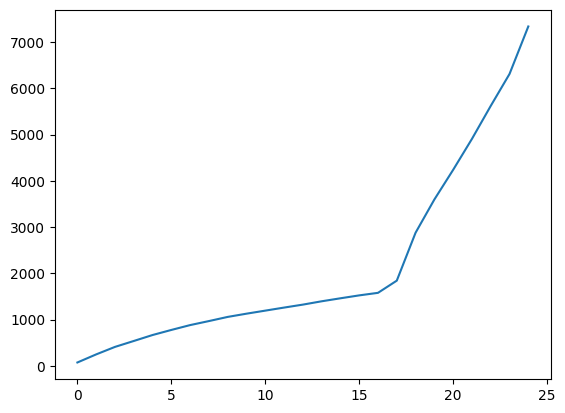

In [48]:
plt.plot(total_intersections)